<a href="https://colab.research.google.com/github/Shuraimi/Dog-vision-project/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 🐶 End-to-end Multi Class Dog breed classification

This notebook builds an end-to-end multi class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying breed of dog given an image of a dog.

Whem i'm sitting at the cafe and I take a photot of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dodg breed identification competition.

## 3. Evaluation

The evaluation is a file with prediciton probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:-
* We're dealing with images (unstructured data) so it's probably best we use DL/ transfer learning.
* There are 120 dog breeds (this means there are 120 different classes)
* There areariund 10,000+ images in training set (these images have labels)
* There are around 10,000+ images in test dataset (these images do not have labels)

unzip the dog vision folder

In [16]:
#!unzip 'drive/MyDrive/Dog_vision_project/dog-breed-identification.zip' -d 'drive/MyDrive/Dog_vision_project/'

### 0. Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [17]:
# import necessary tools into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version",tf.__version__)
print("Hub version",hub.__version__)

# check for GPU availability
print('GPU','available (YESSSS!!!!!!!!!)' if tf.config.list_physical_devices("GPU") else 'not available')

TF version 2.15.0
Hub version 0.16.1
GPU available (YESSSS!!!!!!!!!)


How to use a GPU?

- Go to Runtime and Change runtime type
- Then select a GPU

GPU is 30x faster than CPU

## Getting our data ready (turning into tensors)

With all machine learning modles, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors(numerical representations).

Let's start by accessing our data and checking out the labels.

In [18]:
# checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv('drive/MyDrive/Dog_vision_project/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [19]:
# how many images are thre of ecah breed
labels_csv.breed.value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

Text(0, 0.5, 'Count of each breed')

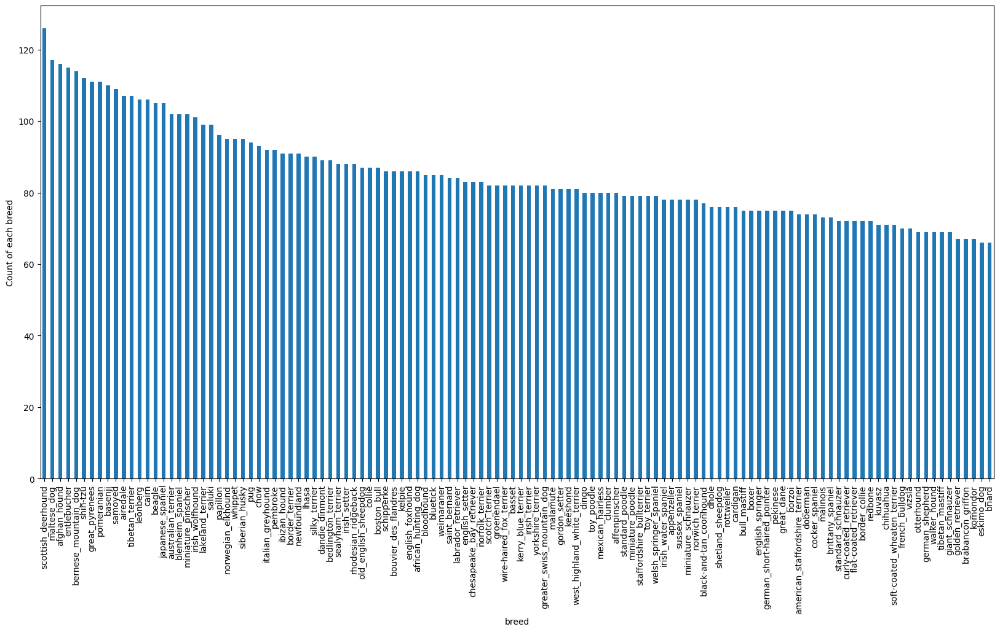

In [20]:
# visualise the dog breeds
import matplotlib.pyplot as plt
labels_csv.breed.value_counts().plot.bar(figsize=(20,10));
plt.ylabel("Count of each breed")

In [21]:
labels_csv.breed.value_counts().median()

82.0

Our data has median of 82 and it has approx 75-85 images per class and which means our data is pretty well spread out.

In our data, we have more than 120 images of scottish deerhound and approx 75 of eskimo dog. Google recommends a minimum of 10 images per class and 100 images per class is great.

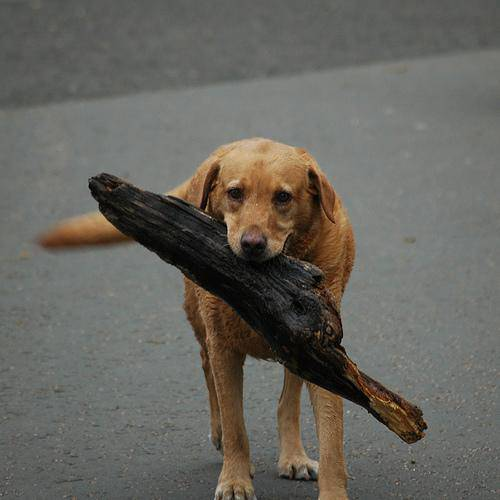

In [22]:
# Let's view an image
# method 1
from IPython.display import Image
Image("drive/MyDrive/Dog_vision_project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames

In [23]:
# create pathnames from image ID's
filenames=['drive/MyDrive/Dog_vision_project/train/'+fname+'.jpg' for fname in labels_csv['id']]

# check first 10
filenames[:10]

['drive/MyDrive/Dog_vision_project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_vision_project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_vision_project/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_vision_project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_vision_project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_vision_project/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_vision_project/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_vision_project/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_vision_project/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_vision_project/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [24]:
# Check whether number of file names matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog_vision_project/train'))==len(filenames):
    print('Filenames match actual amount of files!!! Proceed')
else:
    print('Filenames do not match actual amount of files, check the target directory')

Filenames match actual amount of files!!! Proceed


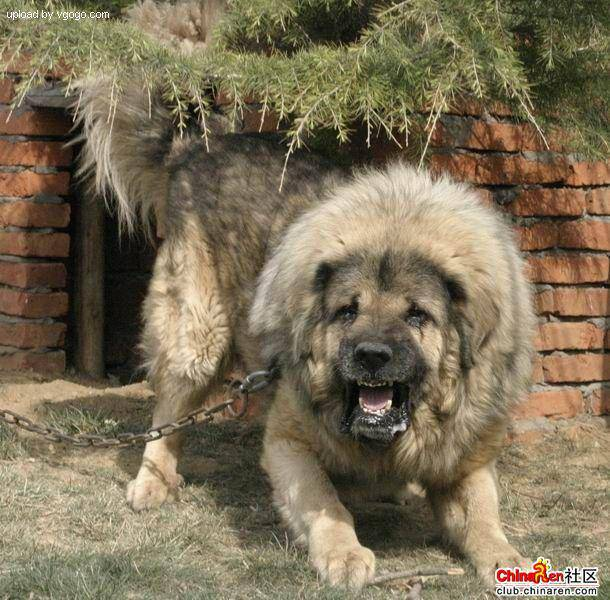

In [25]:
# one more check
Image(filenames[9000])

In [26]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [27]:
import numpy as np
labels=labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [28]:
len(labels)

10222

In [29]:
# See if number of labels matches the number of filenames
if len(labels)==len(filenames):
    print("Number of labels matches number of filenames")

else:
    print("Number of labels doesn't match number of filenames, check the directories")

Number of labels matches number of filenames


In [30]:
# Find the unique label values
unique_breeds=np.unique(labels)

In [31]:
len(unique_breeds)

120

In [32]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [33]:
# Turn every label into a boolean array
boolean_labels=[label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [34]:
len(boolean_labels)

10222

In [35]:
# example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds==labels[0]))# index where label occurs
print(boolean_labels[0].argmax()) # index where label ocurs in boolean array
print(boolean_labels[0].astype(int)) # there willl be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since we don't validation set from the data we donwloaded, we're going to create our own.

In [36]:
# setup X and y variables
X=filenames
y=boolean_labels

In [37]:
len(filenames)

10222

Since we're working with 10,222 images, it's a good idea to start working with a portion of them first to make sure things are working before we go and train ml model on all the data and this also minimises the time between experiments to know what works and what doesn't.

So we'll start with 1000 images at first and then increase it as we need. This is applicable to all sorts of ML problems and not just images.

In [38]:
# set number of images to use for experimenting
NUM_IMAGES=1000 #@param {type:'slider', min:1000,max:10000,step:1000}

The above slider is a special feature colab has over jupyter aside from having GPU.

In [39]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split the data into train and validation sets of total size of NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [40]:
X_train[:5]

['drive/MyDrive/Dog_vision_project/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog_vision_project/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog_vision_project/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog_vision_project/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog_vision_project/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

In [41]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Preprocessing images (trun images into tensors)

To preprocess our images into tensors, we are going to write a function which does a few things:-

1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable `None`
3. Turn our image into tensors
4. Resize the image to be a shape of (224,224)
5. Return the modified image

Before we do,let's see what importing an image looks like

In [42]:
# convert image into Numpy array
from matplotlib.pyplot import imread
Image=imread(filenames[42])
Image.shape

(257, 350, 3)

This shape is width,height and color channel which is combination of red,blue and green and values ranging from 0-255.

In [43]:

# this is how an images looks like in a Numpy array
Image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [44]:
# turn image into tensor
# and this is how an image looks in tensor
tf.constant(Image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

The only difference between the two above is that the one below is in tensor which is able to run on a GPU a lot faster.

Now we've seen what an image looks like as a tensor, let's make a function to preprocess them:

1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable `None`
3. Turn our image into tensors
4. Normalize our image (convert colour channel values from 0-255 to 0-1)
5. Resize the image to be a shape of (224,224)
6. Return the modified image

In [65]:
#define image size
IMG_SIZE=224

# create a function for preprocessing images
def process_images(image_path):
    """
    Take an image filepath and turn it into tensor
    """
    IMG_SIZE=224
    # read in an image file
    img=tf.io.read_file(image_path)

    # turn jpeg image into numerical tensor with 3 color channels red blue and green
    img=tf.image.decode_jpeg(img,channels=3)

    # convert colour channel values from 0-255 to 0-1 (normalisation)
    img=tf.image.convert_image_dtype(img,tf.float32)

    # resize our image to desired value (224,224)
    img=tf.image.resize(img,size=[IMG_SIZE,IMG_SIZE])

    return img

Rewrite a function line by line if your not sure what it does

In [46]:
img=tf.io.read_file(filenames[32])
img

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [47]:
img=tf.image.decode_jpeg(img,channels=3)

In [48]:
tf.image.convert_image_dtype(img,tf.float32)

<tf.Tensor: shape=(375, 500, 3), dtype=float32, numpy=
array([[[0.        , 0.07450981, 0.01176471],
        [0.        , 0.09019608, 0.02745098],
        [0.2784314 , 0.36078432, 0.3019608 ],
        ...,
        [0.00392157, 0.0509804 , 0.01176471],
        [0.01176471, 0.05882353, 0.01960784],
        [0.01568628, 0.0627451 , 0.02352941]],

       [[0.16862746, 0.25882354, 0.19607845],
        [0.        , 0.03529412, 0.        ],
        [0.        , 0.0509804 , 0.        ],
        ...,
        [0.00784314, 0.05490196, 0.01568628],
        [0.01568628, 0.0627451 , 0.02352941],
        [0.01960784, 0.06666667, 0.02745098]],

       [[0.1764706 , 0.25490198, 0.20784315],
        [0.06666667, 0.14509805, 0.09803922],
        [0.        , 0.05490196, 0.00784314],
        ...,
        [0.01568628, 0.05490196, 0.02352941],
        [0.01960784, 0.05882353, 0.02745098],
        [0.02352941, 0.0627451 , 0.03137255]],

       ...,

       [[0.36862746, 0.53333336, 0.27450982],
        [0.36

Instead of these colour values being 0-255, color values between 0-1 makes it computing efficient.

What is a batch / min-batch?
Its a small portion of your data.
32 is the default btach size.

yann lecun or jeremy howard space topic name to get what they write about a topic. Example:-
yann lecun batch size i.e google someone's name and the topic name

### Turing our data into batches

Why turn on data into batches?

Let's say you're trying to prcess 10,00+ images in one go... they all might not fit into memory and ultimately slows down training process and breaks down everything.

So that's why we do 32 images (this is batche size which can also be manually adjusted if needed) at a time.

In order to use TnesorFlow effectively, we need our data in fomr of Tensor tuples which look like this: `(image,label)`

In [49]:
# create a simple function to return a tuple (image,label)

def get_image_label(image_path,label):
    """
    Takes an image file path name and the associated label.
    processes the image and returns a tuple of (image,label)
    """
    return process_images(image_path,224),label

In [50]:
# demo of the above
(process_images(X[24],224),tf.constant(y[24]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.        , 0.02205882, 0.0004902 ],
         [0.00205707, 0.03686975, 0.00378151],
         [0.00747549, 0.04903712, 0.01661415],
         ...,
         [0.02267136, 0.07724071, 0.03515386],
         [0.04925642, 0.09582529, 0.05936681],
         [0.00441176, 0.02794118, 0.00588235]],
 
        [[0.        , 0.03921569, 0.00539216],
         [0.02015932, 0.06678046, 0.03295694],
         [0.04519433, 0.08964461, 0.05761555],
         ...,
         [0.08460237, 0.14753135, 0.1039739 ],
         [0.10557685, 0.16096902, 0.12028274],
         [0.02205882, 0.07745098, 0.03676471]],
 
        [[0.        , 0.03921569, 0.00784314],
         [0.02633053, 0.06883754, 0.03746499],
         [0.05254727, 0.09568454, 0.06431198],
         ...,
         [0.08066337, 0.1504638 , 0.10379888],
         [0.08968931, 0.15733637, 0.11174814],
         [0.        , 0.06764706, 0.02205883]],
 
        ...,
 
        [[0.00490196, 0.02009804

Now we've got a way to turn our data into tuples of Tensors in the form:`(image,label)`, let's make a function to turn all of our data (`X` & `y`)
into batches.

All of this is from the documentation on colab about load and preprocess data.

Read through it even if you don't understand for the first time. Try it out and then see how it goes.

We're going to turn our data into train, validation and test batches.

In [67]:
# define the batch size, 32 is a good start
BATCH_SIZE=32

# create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    It shuffles the data if it'straining data but doesn"t shuffle if it's validation data
    Also accepts test data as input (no labels)
    """
    # If the data is a test dataset, we probably don't have labels
    if test_data:
        print("Creating test data batches...") # beacuse we are creatin test batvhes
        data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) # which says passs me some tensors and i'll create a dataset out of it and contains only filenames
        data_batch=data.map(process_images).batch(BATCH_SIZE) # take the data which is filenames in form of tensors and map our process image function and then turn it into batch of batch size
        return data_batch

    # if the data is a valid dataset, we don't need to shuffle it
    elif valid_data:
        print('Creating validation data batches...')
        data=tf.data.Dataset.from_tensor_slices((tf.constant(X),# filepaths
                                                 tf.constant(y)))# labels
        data_batch=data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch
    else:
        print('Creating training data batches')
        #turn filepaths and labels into tensors
        data=tf.data.Dataset.from_tensor_slices((tf.constant(X),# filepaths
                                                 tf.constant(y)))# labels

        # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
        data=data.shuffle(buffer_size=len(X))

        # create (image,label) tuples (this also turns image path into preprocessed image)
        data=data.map(get_image_label)

        # turn traing data into batches
        data_batch=data.batch(BATCH_SIZE)
        return data_batch


In [52]:
X_train

['drive/MyDrive/Dog_vision_project/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog_vision_project/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog_vision_project/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog_vision_project/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog_vision_project/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/MyDrive/Dog_vision_project/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/MyDrive/Dog_vision_project/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/MyDrive/Dog_vision_project/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/MyDrive/Dog_vision_project/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/MyDrive/Dog_vision_project/train/143b9484273e57668d03bfc26755810a.jpg',
 'drive/MyDrive/Dog_vision_project/train/019ff93e03802e661577b5869e099dcb.jpg',
 'drive/MyDrive/Dog_vision_project/train/035f28d8ad34afaf7c8d276d6674bf8f.jpg',
 'drive/MyDrive/Dog_vision_project/train

If you're going to reuse some functionality later on, then create a function

In [53]:
# create traing and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches
Creating validation data batches...


In [54]:
# checkout different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

**How to understand a function??**

Write the function by yourslef, break it down and run it line by line .

In ML, preprocessing is very important step.

### Visualising data batches

Our data is now in batches, however these can be a little hard to understand/comprehend, let's visualise them

In [55]:
import matplotlib.pyplot as plt
# create a function for viewing images in a data batch
def show_25_images(images,labels):
    """
    Displays a plot of 25 images and their labels from a data batch
    """
    #set up figure
    plt.figure(figsize=(10,10))
    # loop through 25 for displaying 25 images
    for i in range(25):
        # create subplots (5 rows and 5 columns)
        ax=plt.subplot(5,5,i+1)
        # display an image
        plt.imshow(images[i])
        # add image label as title
        plt.title(unique_breeds[labels[i].argmax()])
        # turn grid lines off
        plt.axis('off')

In [56]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [57]:
# to visulaise, we need to unbatch a batch using the below code which converts all elements of the dataset into numpy
# next grabs the first batch of this iterator
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          ...,
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01]],
 
         [[9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          ...,
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01]],
 
         [[9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          [9.92156923e-01, 8.07843208e-01, 6.03921592e-01],
          ...,
          [9.92156923e-01, 8.07843208e-01, 6.0392

In [ ]:
len(train_images),len(train_labels)

In [59]:
# now lets viuslaise the data in a training batch
# train_images,train_labels=next(train_data.as_numpy_iterator())
# show_25_images(train_images,train_labels)

In [60]:
#visualise data in the validation batch
# val_images,val_labels=next(val_data.as_numpy_iterator())
# show_25_images(val_images,val_labels)

## How machines learn?
https://www.youtube.com/watch?v=R9OHn5ZF4Uo
https://www.youtube.com/watch?v=aircAruvnKk

Websites for Deep Learning

- TensorFlow Hub
- Pytorch Hub
- Model zoo
- Papers with code

Learn to build things from stratch is a great approach but building projects on the go is also better and you can dive deeper into these tools.

## Building the model

Before we build a model, there are a few things we need to define
* The input shape (our images shape in form of Tensors) to our model.
* The output shape (image labels in form of Tensors) of our model.
* The URL of the model we want to use https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/2

In [46]:
# set up input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] # batch, height , width, colour channels

# setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

# set up model URL from TensorFlow Hub
MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/2"

We'll use Keras API for building Deep Learning models.

Difference between Sequential and Functional API in Keras.
Go throgh the TensorFlow Keras API guide.

Now e've got or inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've choosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that.)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model input shape it'll be getting)
* Returns the model

We can write these steps line by line but its better to functionaise.

Alll of these steps can be found here : https://www.tensorflow.org/guide/keras

In [47]:
# cReate a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
    print("Bulding the model with: ", MODEL_URL)

    # set up model layers
    model=tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                              activation='softmax') # layer 2 (output layer)
    ])

    # compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=['accuracy']
    )

    # build the model
    model.build(INPUT_SHAPE)

    return model

The code to *set up the model*:-
We are creating a Keras layer and is telling tensorflow hub to create a keras layer of the model url as input layer and this, gives output in the shape of 1x1x1280 but we have only 120 classes so we use Dense layer with output shape of 120 and activation of softmax.

We don't tell the ml model which of the features it learns. It figures out the patterns by itself.

For the model compilation part of te code,
Suppose that you're at the International Hill Descending CHampionship and you have to go down the hill.

So loss tells us how well our model is learning patterns and the closer it is to 0, the better it performs and is learning patterns well.

The optimizer is a friend who's guiding you to go down the hill. The optimizer navigates the loss down the hill i.e it navigates to lower the loss function.

The metric is a way of evaluating after it guesses.

Use activation: Sigmoid and loss: BinaryCrossentropy for Binary classification and

Use activation: softmax and loss: CategoricalCrossentropy for Multiclass classification



In [48]:
model=create_model()
model.summary()

Bulding the model with:  https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


Here some parameters are non-trainable because these parametrs are of mobilenet v2 has learned throughout the layers it has on the images it was originally trained on. So here, we use transfer learning to figure out the patterns in the data we provide it using the patterns it already figured.

## Creating callbacks

Callbacks are helper functions a model can use during training to do things like save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks one for TensorBoard which helpstrack our models progress and another for early stopping which prevents our model from training for too long

### TensorBoard Callback

To set up a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()`.
3. Visualise our models training logs with the `%tensorboard` magoc function (after training)


In [49]:
# load tensorboard notebook extension
%load_ext tensorboard

In [50]:
import datetime
# create a function to build a TensorBoard callback
def create_tensorboard_callback():
    # create a log directory for storing tensorboard logs
    logdir=os.path.join('drive/MyDrive/Dog_vision_project/logs',
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
    return tf.keras.callbacks.TensorBoard(logdir)


Early stopping helps prevent overfitting the model, beacuse if the model overfits, then it won't generalise well.

### Early stopping callback

Early stopping helps stop our model from overfitting by stoppping training if a certain evaluation metric stops improving.

In [51]:
# create early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                patience=3)

## Training a model (on subset of data)

We are going to train our first model only on 1000 images to make sure everything is working and also to minimise time between experiments.

We define a paramter called epoch which means, one epoch would be giving our mdel a single chance to look at all of the training data and validating it from there.  

Whereas a 100 epoches would mean giving our model a 100 chances to go through the training data and figure out patterns.

In [52]:
NUM_EPOCHS=100 #@param {type:'slider',min:10, max:100,step:10}

In [53]:
# check out again if we are using a GPU
print("GPU","available Yesss" if tf.config.list_physical_devices("GPU") else "not available")

GPU available Yesss


Let's create a function which trains a model.

* Create a model using `create_model()`
* Set up a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for( `NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [54]:
# Build a function to train and return a rained model
def train_model():
    """
    Trains a given model and returns the trained version
    """
    # create a model
    model=create_model()

    # create new tensorboard session everytie we train a model
    tensorboard=create_tensorboard_callback()

    # fit the model to the data passing it the callbacks we created
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard,early_stopping])

    # return the fitted model
    return model

In [55]:
# fit the model to the data
model=train_model()

Bulding the model with:  https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 283s 11s/step - loss: 4.4055 - accuracy: 0.1138 - val_loss: 3.3847 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 4s 179ms/step - loss: 1.5494 - accuracy: 0.7075 - val_loss: 2.1912 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 145ms/step - loss: 0.5445 - accuracy: 0.9325 - val_loss: 1.7084 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 5s 189ms/step - loss: 0.2494 - accuracy: 0.9850 - val_loss: 1.5361 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 6s 228ms/step - loss: 0.1460 - accuracy: 0.9975 - val_loss: 1.4620 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 168ms/step - loss: 0.0998 - accuracy: 0.9987 - val_loss: 1.4270 - val_accuracy: 0.6300
Epoch 7/100
25/25 [===========

If the model is learning patterns, then the loss should go down and the accuracy should go up.

The model is overfitting because it is performing better on training data than the validation data and therfore our model has por ability to generalise.

**Question:** It looks like our model is overfitting because it's performing far better on training data than on the validation dataset, what are some ways to prevent model overfitting in deep learning neural netwroks?

**Note:** Overfittng to begin with is a good thing. It means our model is learning.

**Answer:-** The best way to redue overfitting is to collect more data but it is not possible for real-world datasets. There are three methods:-
1. Reducing networks capacity
2. Regularisation
3. Dropping out layers (setting them to 0)

### Checking the Tensorboard logs

Beacuse whenever we train a model, its (TensorBoard callback) gonna automatically log its performance in the logs folder.

The TensorBoard magic function (`tensorboard`) will access the logs directory we created earlier snd visualise its contents

In [56]:
%tensorboard --logdir drive/MyDrive/Dog_vision_project/logs

<IPython.core.display.Javascript object>

This tensorboard is going to very very helpful in traking the various experients we perform over time in order to improve the performnec of the model and also to reduce overfitting.

## Making and evaluating predictions using a trained model

In [57]:
# make predictions on the validation data (not used to train on)
predictions=model.predict(val_data,verbose=1) # verbose just says when yuou're making predictions, just show me the progress
predictions

7/7 [==============================] - 3s 161ms/step


array([[3.51772062e-03, 1.79010138e-04, 1.62567175e-03, ...,
        4.25786093e-05, 4.62272365e-05, 1.08876568e-03],
       [3.33244423e-03, 1.08502537e-03, 1.48737002e-02, ...,
        4.92640305e-04, 9.50612011e-04, 7.84578093e-04],
       [4.01843999e-06, 8.25885945e-05, 4.99078578e-06, ...,
        2.27718101e-05, 6.19152206e-06, 4.62363714e-05],
       ...,
       [7.73015563e-06, 8.59819193e-05, 3.08625567e-05, ...,
        8.36724503e-05, 4.23972931e-04, 6.10202260e-05],
       [8.73025507e-03, 4.44354228e-04, 2.08055309e-04, ...,
        8.29451601e-05, 4.27527339e-05, 1.18040405e-02],
       [1.85625555e-04, 1.02284146e-04, 5.64242946e-04, ...,
        1.01158908e-03, 2.72236415e-04, 3.49167458e-05]], dtype=float32)

In [58]:
predictions[0] # gives an array of probabilities as to what the model thinks an image is and what is the probability of this image when compared to the breeds(120)

array([3.5177206e-03, 1.7901014e-04, 1.6256717e-03, 3.8821945e-05,
       4.6779623e-04, 1.5193799e-04, 1.0630206e-02, 7.4031891e-04,
       2.0556552e-04, 5.8910839e-04, 1.9444592e-04, 1.0312744e-04,
       1.7074100e-04, 4.5750177e-04, 6.0626591e-04, 1.6931738e-04,
       7.5158394e-05, 2.1727727e-01, 7.1903880e-05, 3.9204423e-04,
       4.1340315e-04, 4.0042600e-05, 8.7575092e-05, 2.9392086e-04,
       6.5513319e-05, 2.2736317e-04, 5.7929900e-02, 7.1975606e-04,
       1.4601027e-03, 3.0585492e-04, 1.9579529e-04, 4.7328244e-03,
       3.7187393e-04, 1.3443299e-05, 3.2502383e-05, 6.9890007e-02,
       1.9263874e-05, 1.2618556e-03, 8.4373605e-05, 5.4744777e-04,
       1.5115956e-03, 3.6428166e-05, 2.9351724e-05, 3.8547302e-04,
       1.4101127e-04, 1.2097389e-04, 7.2484552e-05, 1.5008209e-04,
       4.1480449e-05, 1.1830725e-03, 1.2191847e-04, 4.9923059e-05,
       4.3217174e-04, 7.1205381e-05, 9.7267104e-05, 9.7524164e-05,
       3.7068756e-05, 4.0027304e-03, 1.7307274e-04, 1.1165670e

So the highest value in the above array is going to correspond to the index of the label that the model thinks is most likely and sum of these probabilities is almost 1.

In [59]:
predictions.shape

(200, 120)

In [60]:
len(y_val)

200

In [61]:
# first prediction
index=42
print(predictions[index])
print(f"Max value (probabolity of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")
# print(f"Actual label: {unique_breeds[index]}")

[1.68953949e-04 9.81163394e-05 2.09605805e-05 4.72655884e-05
 1.99510320e-03 1.27595427e-04 2.76491308e-04 1.28955336e-03
 7.11434986e-03 3.49031650e-02 1.00088100e-05 9.48555407e-06
 4.77086985e-04 2.27004359e-03 4.70941362e-04 7.34305009e-04
 3.85346311e-06 6.56779332e-04 2.47376011e-04 6.99370983e-04
 3.40318220e-05 1.44922349e-04 4.56144589e-05 5.06419783e-05
 7.59256398e-03 2.00864361e-05 7.91578277e-05 2.65730523e-05
 3.79950681e-04 1.16334659e-05 1.30397719e-04 1.25756036e-04
 9.71831323e-05 5.00023634e-05 1.82252898e-05 2.39603440e-04
 2.40636698e-04 9.48262968e-05 2.32340153e-05 2.47721076e-01
 2.49768229e-04 1.15071743e-04 2.14827387e-03 1.33374397e-05
 3.68481124e-04 1.13330561e-05 2.38400316e-04 1.70186779e-03
 7.73505053e-06 5.45382034e-04 2.30802223e-04 1.04031053e-04
 4.13379777e-04 3.01704713e-04 3.21223160e-05 1.45041951e-04
 1.31014996e-04 4.04804814e-05 1.03746452e-05 3.73207949e-05
 8.56066035e-05 2.05102551e-04 6.13666498e-06 1.09347231e-04
 1.93833243e-04 2.501371

Having the above functionality is great but we want to be able to do it at scale.

And it would be better if we could see the image the prediction is made on.

**Note:** Prediction probabilities are also known as confidence levels

In [62]:
# Turn probabilities into their respective label
def get_pred_label(prediction_probabilities):
    """
    Turns an array of prediction probabilities into a label.
    """
    return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[81])
pred_label

'dingo'

Since our validation data is still in a abatch, we'll have to unbatchify it to make predictions on the validation images and then copare those predictions.

In [63]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [64]:
# create a function to unbatch a batch dataset
def unbatchify(data):
    """
    Takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels
    """
    images=[]
    labels=[]
    for image,label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
    return images,labels

# unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [65]:
val_labels

['cairn',
 'scotch_terrier',
 'basset',
 'bluetick',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'border_collie',
 'yorkshire_terrier',
 'border_collie',
 'yorkshire_terrier',
 'whippet',
 'english_foxhound',
 'standard_poodle',
 'irish_setter',
 'african_hunting_dog',
 'vizsla',
 'irish_water_spaniel',
 'flat-coated_retriever',
 'samoyed',
 'cairn',
 'blenheim_spaniel',
 'welsh_springer_spaniel',
 'scottish_deerhound',
 'komondor',
 'norwich_terrier',
 'cardigan',
 'dingo',
 'dandie_dinmont',
 'walker_hound',
 'walker_hound',
 'mexican_hairless',
 'eskimo_dog',
 'siberian_husky',
 'welsh_springer_spaniel',
 'doberman',
 'mexican_hairless',
 'kuvasz',
 'labrador_retriever',
 'wire-haired_fox_terrier',
 'english_foxhound',
 'collie',
 'toy_poodle',
 'groenendael',
 'boston_bull',
 'standard_poodle',
 'miniature_poodle',
 'chihuahua',
 'staffordshire_bullterrier',
 'vizsla',
 'norfolk_terrier',
 'pug',
 'bedlington_terrier',
 'affenpinsche

In [66]:
images_=[]
labels_=[]

# loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
    print(image)
    print(label)

Streaming output truncated to the last 5000 lines.

 [[0.25513488 0.2201559  0.19254734]
  [0.25818455 0.22320555 0.19559701]
  [0.28897905 0.25400007 0.22639151]
  ...
  [0.1393125  0.11606315 0.06900433]
  [0.12893534 0.11324905 0.06619023]
  [0.1432429  0.12755662 0.08441938]]

 ...

 [[0.3310362  0.49429712 0.192543  ]
  [0.33433145 0.47802895 0.20559186]
  [0.30533677 0.42943233 0.1872521 ]
  ...
  [0.46766642 0.56528556 0.3105236 ]
  [0.46012917 0.5464037  0.29220206]
  [0.43060845 0.51802564 0.25969562]]

 [[0.23758024 0.40422344 0.09904134]
  [0.29779172 0.44837025 0.16837995]
  [0.34402    0.46993035 0.22217126]
  ...
  [0.4661402  0.56106675 0.314582  ]
  [0.47245407 0.5587286  0.3078179 ]
  [0.44306177 0.5293363  0.27553126]]

 [[0.2004445  0.37246928 0.06589444]
  [0.26245335 0.41708085 0.13304158]
  [0.34722233 0.47338593 0.21853644]
  ...
  [0.43430075 0.52813834 0.28500107]
  [0.4386964  0.5249709  0.2753912 ]
  [0.43219256 0.51846707 0.26725814]]]
[False False False Fal

In [67]:
labels_

[]

Here the image is in form of a preprocessed image and this is printing out the image then the label so on.

But we'll append it.

In [68]:
images_=[]
labels_=[]

# loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(label)
images_[0],labels_

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [69]:
get_pred_label(labels_[0])

'cairn'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualisable.

We'll create a function which :
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability , the truth label and target image on a single plot.

In [70]:
def plot_pred(prediction_probabilities, labels, images,n=1):
    """
    View the prediction, groud truth and the image for sample n
    """
    pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

    # get pred label
    pred_label=get_pred_label(pred_prob) # since we have pred_prob, we can get it's label using the function

    # plot image and remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # change the color of the title depending if the prediction is right or wrong
    if pred_label==true_label:
        color='green'
    else:
        color='red'


    # change plot title to be predicted, probability of prediction and truth label
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
              color=color
              )

In [71]:
val_labels

['cairn',
 'scotch_terrier',
 'basset',
 'bluetick',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'border_collie',
 'yorkshire_terrier',
 'border_collie',
 'yorkshire_terrier',
 'whippet',
 'english_foxhound',
 'standard_poodle',
 'irish_setter',
 'african_hunting_dog',
 'vizsla',
 'irish_water_spaniel',
 'flat-coated_retriever',
 'samoyed',
 'cairn',
 'blenheim_spaniel',
 'welsh_springer_spaniel',
 'scottish_deerhound',
 'komondor',
 'norwich_terrier',
 'cardigan',
 'dingo',
 'dandie_dinmont',
 'walker_hound',
 'walker_hound',
 'mexican_hairless',
 'eskimo_dog',
 'siberian_husky',
 'welsh_springer_spaniel',
 'doberman',
 'mexican_hairless',
 'kuvasz',
 'labrador_retriever',
 'wire-haired_fox_terrier',
 'english_foxhound',
 'collie',
 'toy_poodle',
 'groenendael',
 'boston_bull',
 'standard_poodle',
 'miniature_poodle',
 'chihuahua',
 'staffordshire_bullterrier',
 'vizsla',
 'norfolk_terrier',
 'pug',
 'bedlington_terrier',
 'affenpinsche

In [72]:
val_images

[array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

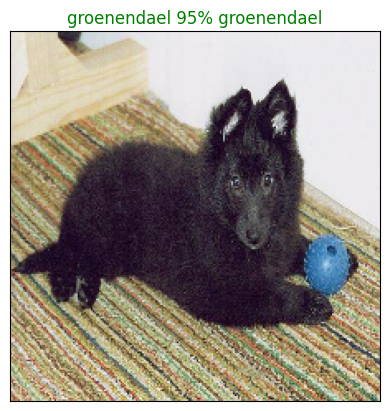

In [73]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=77)

Now we've got one function to visulaise our models top prediction, let's make another to view our modes top 10 predictions

This function will :
* Take an input of prediction probabilities array and a groung truth array and an integer
* Find the prediction using `get_pred_label()`
* Find top 10
  - Prediction probabilities indexes
  - Prediction probabilitoes values
  - Prediction labels
* Plot the top 10 prediction probabiity values and labels, coloring true label green

In [74]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
    """
    Plots top 10 highests prediction confidences along with the truth label for sample n
    """
    pred_prob,true_label=prediction_probabilities[n],label[n]

    # get predicted label
    pred_label=get_pred_label(pred_prob)

    # find top 10 confidence indexes
    top_10_pred_indexes=pred_prob.argsort()[::-1][:10]

    # find the top 10 prediction confidence values
    top_10_pred_values=pred_prob[top_10_pred_indexes]

    # find the top 10 prediction labels
    top_10_pred_labels=unique_breeds[top_10_pred_indexes]

    # set up plot
    top_plot=plt.bar(np.arange(len(top_10_pred_indexes)),
                                   top_10_pred_values,
                                   color='grey')

    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation='vertical')

    # change color of true label
    if np.isin(true_label,top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
    else:
        pass

# true_label_index = np.where(top_10_pred_labels == true_label)[0]
#     if len(true_label_index) > 0:
#         true_label_index = true_label_index[0]  # in case true_label appears multiple times
#         top_plot[true_label_index].set_color("green")


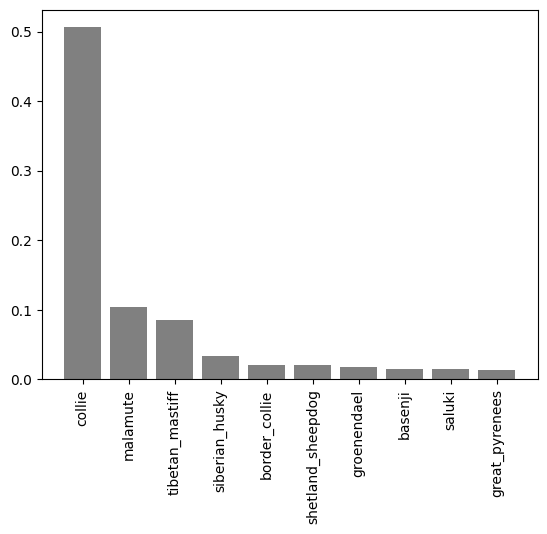

In [75]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_data,
               n=9)

In [76]:
# getting the top 10 predictions

# returns predictions sorted in ascending order
# but we want the top 10
predictions[0].argsort()

array([ 33,  36, 115,  63, 101,  98,  42,  34,  41,  56,  94,   3,  21,
        48, 117, 108, 118,  84,  51, 112, 107,  60,  24,  53,  18,  46,
        16,  38,  92,  75,  22,  54,  55,  11,  45,  50, 111,  44,  69,
        71,  47,   5,  15,  12,  58,   1,  10,  30,  61,   8,  85,  25,
        99,  82,  86,  23,  29,  72,  32, 104,  43,  95,  19,  20,  52,
        67, 105,  13,  96,  74,  80,   4, 113,  78,  87,  39,   9,  14,
        90,  27,  76,   7,  81,  64,  88,  91,  66, 114, 119,  49,  37,
        28,  40,   2,  62,  93, 110,  83,   0, 106,  57,  77,  31,  89,
        97,   6,  68, 116,  65,  70, 103,  79, 100,  26, 102,  35,  59,
        73, 109,  17])

In [77]:
# get the last ten from the above list
# first reverse the list and then take the first 10
predictions[0].argsort()[::-1][:10]

array([ 17, 109,  73,  59,  35, 102,  26, 100,  79, 103])

In [78]:
predictions[0][predictions[0].argsort()[::-1][:10]]

array([0.21727727, 0.13362424, 0.11845905, 0.1116567 , 0.06989001,
       0.06857228, 0.0579299 , 0.05127574, 0.01763387, 0.01505215],
      dtype=float32)

In [79]:
unique_breeds[predictions[0].argsort()[::-1][:10]]

array(['border_terrier', 'tibetan_terrier', 'maltese_dog',
       'irish_wolfhound', 'dandie_dinmont', 'silky_terrier', 'cairn',
       'shih-tzu', 'norfolk_terrier', 'soft-coated_wheaten_terrier'],
      dtype=object)

Now we've got some function to help us visualise our predictions and evaluate our model, let's check out a few.

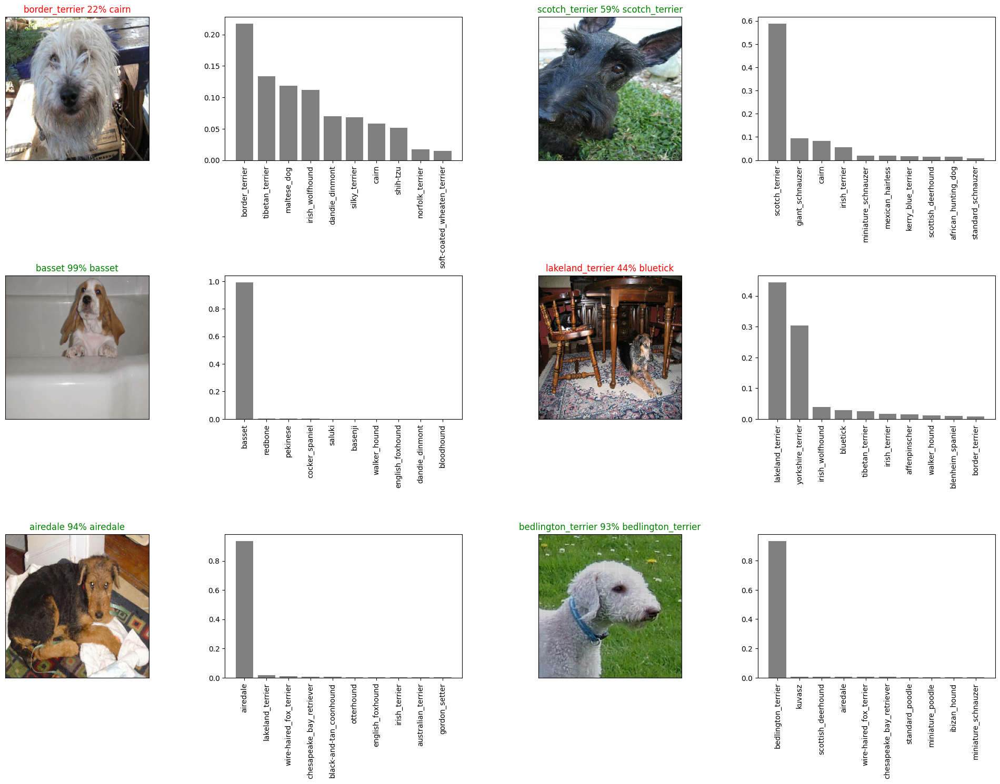

In [80]:
# let's checkout a few predictions and their different values
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows,2*num_cols,2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows,2*num_cols,2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading your model



In [81]:
# create a function to save a model
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix string
    """
    # create a model directory pathname with current time
    modeldir=os.path.join('drive/MyDrive/Dog_vision_project/models',
                          datetime.datetime.now().strftime("%Y%m%d-$H%M%s"))
    model_path=modeldir+"-"+suffix+'.h5'# save format of model
    print(f"Saving model to: {model_path} ...")
    model.save(model_path)
    return model_path

In [3]:
# create a function to load a model
def load_model(model_path):
    """
    Loads a saved model from a sepcific path
    """
    print(f"Loading saved model from {model_path} ...")
    model=tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
    return model

Now we've got functions to save and load a trained model, let's make sure they work.

In [84]:
#save our model trained on 1000 images
save_model(model,suffix='100_images-mobilenetv2-adam')

Saving model to: drive/MyDrive/Dog_vision_project/models/20240521-$H261716301610-100_images-mobilenetv2-adam.h5 ...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog_vision_project/models/20240521-$H261716301610-100_images-mobilenetv2-adam.h5'

In [85]:
# load a trained model
loaded_trained_image_model=load_model('drive/MyDrive/Dog_vision_project/models/20240521-$H261716301610-100_images-mobilenetv2-adam.h5')

Loading saved model from drive/MyDrive/Dog_vision_project/models/20240521-$H261716301610-100_images-mobilenetv2-adam.h5 ...


In [86]:
# evaluate pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 97ms/step - loss: 1.3686 - accuracy: 0.6250


[1.3685524463653564, 0.625]

In [87]:
# evaluate loaded model
loaded_trained_image_model.evaluate(val_data)

7/7 [==============================] - 1s 100ms/step - loss: 1.3686 - accuracy: 0.6250


[1.3685524463653564, 0.625]

## Training a big dog model (on the full data)

In [88]:
len(X),len(y)

(10222, 10222)

In [89]:
len(X_train)

800

In [90]:
# create a data batch with the full data set
full_data=create_data_batches(X,y)

Creating training data batches


In [91]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [92]:
# create  a model for full model
full_model=create_model()

Bulding the model with:  https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/2


In [93]:
# create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
# no val set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                           patience=3)

**Note:** Running the cell below will take a little while (maybe upto 30 mins for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [94]:
# fit the full model to train
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 52s 145ms/step - loss: 1.3349 - accuracy: 0.6670
Epoch 2/100
320/320 [==============================] - 42s 130ms/step - loss: 0.3957 - accuracy: 0.8839
Epoch 3/100
320/320 [==============================] - 41s 128ms/step - loss: 0.2361 - accuracy: 0.9362
Epoch 4/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1540 - accuracy: 0.9636
Epoch 5/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1069 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0772 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0581 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0467 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0374 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 42s 131m

In [95]:
save_model(full_model,suffix='full-image-set-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Dog_vision_project/models/20240521-$H561716303387-full-image-set-mobilenetv2-Adam.h5 ...


'drive/MyDrive/Dog_vision_project/models/20240521-$H561716303387-full-image-set-mobilenetv2-Adam.h5'

In [8]:
loaded_full_model=load_model('drive/MyDrive/Dog_vision_project/models/20240521-$H561716303387-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from drive/MyDrive/Dog_vision_project/models/20240521-$H561716303387-full-image-set-mobilenetv2-Adam.h5 ...


## Making predictions on the test set

Since our model has been trained on images in form of tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image fienames
* Convert filenames into test data batches using `create_data_batches()`
 and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
 * Make predictions array by passing test batches to `predit()` called on our model.

In [71]:
# load test image filenames
import os
test_path='drive/MyDrive/Dog_vision_project/test/'
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_vision_project/test/e39be68f3200f0ecde589e571ae6df06.jpg',
 'drive/MyDrive/Dog_vision_project/test/e17512584de423da7fc17bfb2c7548ae.jpg',
 'drive/MyDrive/Dog_vision_project/test/e12168553b1e0b5e56d5ab6ac8a58984.jpg',
 'drive/MyDrive/Dog_vision_project/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg',
 'drive/MyDrive/Dog_vision_project/test/e644a1f6f9c69ee8f7e8d834730bbfd7.jpg',
 'drive/MyDrive/Dog_vision_project/test/e52a4321a8cb0dd3bcc8f4a68b75eee7.jpg',
 'drive/MyDrive/Dog_vision_project/test/e241bfdd5cc6154698394905abaa0d76.jpg',
 'drive/MyDrive/Dog_vision_project/test/e7a1b7a42db97df750aeae212a02d9c4.jpg',
 'drive/MyDrive/Dog_vision_project/test/e48e4d9137c69e69f54f85907c061172.jpg',
 'drive/MyDrive/Dog_vision_project/test/e6af47e8b6973c8f8d2b9fd5af94c54d.jpg']

In [72]:
len(test_filenames)

10357

In [73]:
# create a test data batch
test_data=create_data_batches(test_filenames,
                              test_data=True)

Creating test data batches...


In [74]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Calling predict on our full model and passing a test data will take a long time to run (~1hr)


In [75]:
# make predictions on test data batch using the loaded full model
test_predictions=loaded_full_model.predict(test_data,
                                           verbose=1)

324/324 [==============================] - 361s 1s/step


In [76]:
# save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog_vision_project/pred_array.csv",test_predictions,delimiter=',')

In [77]:
# load predictions from csv file
test_predictions=np.loadtxt('drive/MyDrive/Dog_vision_project/pred_array.csv', delimiter=",")

In [78]:
test_predictions[:10]

array([[9.02838053e-08, 4.12074513e-10, 5.29933319e-10, ...,
        2.49839906e-11, 1.92266853e-07, 2.15131222e-05],
       [3.66183056e-10, 1.68576528e-10, 5.85539561e-10, ...,
        6.00122263e-09, 5.40514256e-09, 1.39660991e-11],
       [4.36779457e-09, 1.22490462e-10, 9.08927308e-11, ...,
        3.81316034e-10, 2.23544757e-05, 1.03205480e-06],
       ...,
       [1.14283105e-09, 2.15144125e-09, 8.22130419e-10, ...,
        3.21978111e-09, 6.14182636e-06, 8.21556712e-10],
       [1.39040376e-10, 8.22862205e-07, 9.13082421e-01, ...,
        4.97080862e-07, 1.34121558e-09, 3.07647596e-08],
       [3.89073485e-09, 4.67721070e-11, 1.97440111e-12, ...,
        2.58364510e-12, 1.39980172e-11, 1.20334936e-10]])

In [79]:
test_predictions.shape

(10357, 120)

## Preparing file submission for kaggle competition

Looking at Kaggle sample submission, we find that it wants our model's predcition probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to ID column by extracting test image ID's from thier filepaths
* Add data (the prediction probabilities ) to each of the dog breed columns.
* Export DataFrame as a CSv to submit it to Kaggle.

In [84]:
# create a pandas dataframe with empty columns
preds_df=pd.DataFrame(columns=['id']+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [85]:
# append test image ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]

['e39be68f3200f0ecde589e571ae6df06',
 'e17512584de423da7fc17bfb2c7548ae',
 'e12168553b1e0b5e56d5ab6ac8a58984',
 'e008da6b957c62e7bcf6eb2ba4c2abd9',
 'e644a1f6f9c69ee8f7e8d834730bbfd7',
 'e52a4321a8cb0dd3bcc8f4a68b75eee7',
 'e241bfdd5cc6154698394905abaa0d76',
 'e7a1b7a42db97df750aeae212a02d9c4',
 'e48e4d9137c69e69f54f85907c061172',
 'e6af47e8b6973c8f8d2b9fd5af94c54d']

In [86]:
preds_df['id']=test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e39be68f3200f0ecde589e571ae6df06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e17512584de423da7fc17bfb2c7548ae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e12168553b1e0b5e56d5ab6ac8a58984,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e008da6b957c62e7bcf6eb2ba4c2abd9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e644a1f6f9c69ee8f7e8d834730bbfd7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
# add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e39be68f3200f0ecde589e571ae6df06,9.028381e-08,4.120745e-10,5.299333e-10,3.372720e-12,5.363617e-11,1.571344e-08,5.239003e-10,6.196091e-10,1.594796e-11,...,6.343554e-08,1.132790e-06,2.261745e-10,5.294279e-11,6.239137e-11,3.764704e-11,3.250995e-08,2.498399e-11,1.922669e-07,2.151312e-05
1,e17512584de423da7fc17bfb2c7548ae,3.661831e-10,1.685765e-10,5.855396e-10,3.392210e-08,3.681638e-04,1.418015e-06,2.589136e-09,1.820167e-09,3.940124e-08,...,2.199756e-10,9.788793e-09,5.784280e-05,5.286940e-04,4.052669e-04,2.825859e-09,1.319114e-08,6.001223e-09,5.405143e-09,1.396610e-11
2,e12168553b1e0b5e56d5ab6ac8a58984,4.367795e-09,1.224905e-10,9.089273e-11,3.949906e-08,9.509516e-06,5.723992e-10,4.656342e-10,9.596584e-10,2.389902e-08,...,7.933129e-07,4.435362e-08,1.089736e-04,2.429619e-07,7.334708e-05,3.021347e-10,3.248729e-10,3.813160e-10,2.235448e-05,1.032055e-06
3,e008da6b957c62e7bcf6eb2ba4c2abd9,4.395276e-07,1.115602e-09,4.075003e-07,7.611986e-10,2.459281e-06,2.800626e-09,7.070092e-10,3.309023e-07,1.071649e-07,...,7.099006e-07,1.282616e-05,2.104749e-09,6.038470e-07,1.020675e-09,3.014029e-07,9.724694e-01,3.810206e-07,7.324448e-04,5.971982e-06
4,e644a1f6f9c69ee8f7e8d834730bbfd7,1.494222e-08,1.005159e-08,6.244042e-06,1.377894e-08,5.227035e-07,3.153085e-07,5.356467e-06,3.471791e-08,5.426009e-12,...,7.723116e-08,2.198649e-07,2.195828e-09,2.956686e-10,9.385703e-07,9.290557e-11,1.494239e-07,9.281131e-06,1.789137e-08,1.325616e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,07d5ab48d42c8e67b8720ae221ad1962,1.900963e-08,7.454635e-13,9.911873e-12,5.528833e-14,8.802323e-09,1.925247e-11,2.037242e-12,6.932348e-09,2.467353e-13,...,8.367989e-13,5.536522e-12,3.834771e-13,4.409918e-12,8.912969e-12,1.041040e-11,1.134585e-10,1.490657e-13,1.074604e-08,2.989408e-12
10353,07cbc12094a8f4a54700054222a25da3,6.596507e-10,9.939826e-14,2.653952e-14,3.569596e-13,1.202625e-13,1.656321e-11,2.964245e-15,3.588297e-11,1.911551e-11,...,2.191562e-12,6.199912e-12,2.062646e-11,2.570270e-13,4.397691e-14,3.497409e-14,3.404347e-13,1.548681e-13,9.074580e-11,1.164874e-12
10354,089347d3bc5f6b4a4a7d38d10c8f5d90,1.287904e-11,1.905919e-08,3.259607e-07,2.133544e-10,5.696912e-10,8.181895e-10,3.771785e-09,1.803249e-08,1.796261e-10,...,9.508105e-10,3.275754e-08,8.306902e-11,6.550425e-08,5.877990e-09,1.154700e-08,3.216606e-09,7.856893e-09,1.324267e-08,3.755828e-08
10355,07e62ee044a6b7d6a45e92c65ff44f4e,3.377916e-13,2.005279e-11,1.058843e-09,6.919750e-10,6.529239e-08,9.400584e-11,1.117881e-11,1.356418e-11,7.674820e-10,...,1.000923e-08,2.062852e-12,4.142681e-04,4.530788e-08,9.991930e-01,3.470810e-11,3.351008e-10,7.686346e-11,1.604886e-11,3.817412e-07


In [90]:
preds_df.to_csv('drive/MyDrive/Dog_vision_project/submission_1_mobilenetv2.csv',index=False)

When you first start, focus on beating your own score and then see kaggle scores.

## Making predictions on custom images

To make predictions on custo images, we'll:
* Get the filepaths of our own images
* Turn filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass custom image data batch to our model's `predict()`.
* Convert prediction output probabiliyties to prediction labels
* Comapre predicted labels tp custom images.

In [ ]:
# get custo image filepaths
custom_path='drive/MyDrive?Dog_vision_project/my-photos'
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]
custom_image_paths[:10]

In [ ]:
#Turn custom images into batch datasets
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

In [ ]:
# make predictions on custom data
custom_preds=loaded_full_model.predict(custom_data)

In [ ]:
# get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# get custom images ( our unbatchify function won't work bcz we don't have labels)
custom_image=[]

# loop through unbatched dta
for image in custom_data.unbatch().as_numpy_iterator():
    custom_image.append(image)

In [ ]:
# check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_image):
    plt.subplot(1,3,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)